## Sky View factor images
This file is going through many tif.aux files to create the variation from min, max, mean and std.
Finding the right kind of threshold for amplifying all the streams.

In feature creating 02_All_features_creation_manually_classification_pickels.ipynb the name of function ("def ...") can be located from the feature_creation2.

In [89]:
import dask
print(dask.__version__)

2024.8.0


In [7]:
#-------------- .tif.aux.xml files ----------------

import os
import xml.etree.ElementTree as ET

# Define the directory containing the .tif.aux files
input_dir = r"E:\Gradu\TO_NPY"

# Open a file to write the results
with open('skyview_statistics.txt', 'w') as output_file:
    output_file.write("File Name, Minimum, Maximum, Mean, Standard Deviation\n")

    # Loop through the range of files 1 to 21
    for i in range(1, 22):
        # Construct the file path
        file_path = os.path.join(input_dir, f"SVF_{i}.tif.aux.xml")
        
        # Check if the file exists
        if os.path.exists(file_path):
            try:
                # Parse the XML data from the .aux file
                tree = ET.parse(file_path)
                root = tree.getroot()

                # Extract the relevant statistics from the XML structure
                min_value = root.find(".//MDI[@key='STATISTICS_MINIMUM']").text
                max_value = root.find(".//MDI[@key='STATISTICS_MAXIMUM']").text
                mean_value = root.find(".//MDI[@key='STATISTICS_MEAN']").text
                stddev_value = root.find(".//MDI[@key='STATISTICS_STDDEV']").text

                # Write the extracted data to the output text file
                output_file.write(f"SVF_{i}.tif.aux.xml, {min_value}, {max_value}, {mean_value}, {stddev_value}\n")
                # Print the result to the console
                print(f"file{i}.tif.aux: Min = {min_value}, Max = {max_value}, Mean = {mean_value}, StdDev = {stddev_value}")
            except Exception as e:
                print(f"Error processing {file_path}: {e}")
        else:
            print(f"File {file_path} not found.")

print("Skyview statistics have been written to 'skyview_statistics.txt'.")


file1.tif.aux: Min = 0.81088721752167, Max = 1, Mean = 0.99056280865272, StdDev = 0.013514447558945
file2.tif.aux: Min = 0.80007404088974, Max = 1, Mean = 0.99255744116158, StdDev = 0.01072220448444
file3.tif.aux: Min = 0.73134982585907, Max = 1, Mean = 0.99186461498938, StdDev = 0.012659908243932
file4.tif.aux: Min = 0.74595445394516, Max = 1, Mean = 0.98947033129717, StdDev = 0.016454067019627
file5.tif.aux: Min = 0.78160095214844, Max = 1, Mean = 0.99267993056938, StdDev = 0.011514396477052
file6.tif.aux: Min = 0.73988926410675, Max = 1, Mean = 0.99118518859482, StdDev = 0.014477196117477
file7.tif.aux: Min = 0.77687966823578, Max = 1, Mean = 0.99232374025432, StdDev = 0.011474491442512
file8.tif.aux: Min = 0.65675032138824, Max = 1, Mean = 0.99394885360828, StdDev = 0.010663637459206
file9.tif.aux: Min = 0.60185271501541, Max = 1, Mean = 0.99600163565493, StdDev = 0.010053543406354
file10.tif.aux: Min = 0.72100651264191, Max = 1, Mean = 0.99307243441343, StdDev = 0.012716867872861


In [8]:
# Define the thresholds for amplification
ranges = {
    100: (0, 0.90),
    80: (0.90, 0.92),
    60: (0.92, 0.93),
    45: (0.93, 0.94),
    30: (0.94, 0.95),
    20: (0.95, 0.96),
    15: (0.96, 0.97),
    10: (0.97, 0.98),
    5: (0.98, 0.99),
    1: (0.99, 1)
}

# Create a dictionary to count how many times each range is matched
range_counts = {key: 0 for key in ranges.keys()}

# List of statistics from your files (these are sample entries, in practice you'd have this as input data)
file_stats = [
    (0.81088721752167, 1, 0.99056280865272),  # (Min, Max, Mean)
    (0.80007404088974, 1, 0.99255744116158),
    (0.73134982585907, 1, 0.99186461498938),
    (0.74595445394516, 1, 0.98947033129717),
    (0.78160095214844, 1, 0.99267993056938),
    (0.73988926410675, 1, 0.99118518859482),
    (0.77687966823578, 1, 0.99232374025432),
    (0.65675032138824, 1, 0.99394885360828),
    (0.60185271501541, 1, 0.99600163565493),
    (0.72100651264191, 1, 0.99307243441343),
    (0.72849231958389, 1, 0.99491147953041),
    (0.84430831670761, 1, 0.99612745801674),
    (0.75581336021423, 1, 0.99730551592871),
    (0.83952307701111, 1, 0.99423132612672),
    (0.80244827270508, 1, 0.99398491043928),
    (0.85311394929886, 1, 0.9963749723537),
    (0.71189147233963, 1, 0.99423634764452),
    (0.79937309026718, 1, 0.99538352042254),
    (0.73541367053986, 1, 0.99446708621133),
    (0.86842030286789, 1, 0.99752123951981),
    (0.86401128768921, 1, 0.99797604778688)
]

# Loop through the statistics and count the occurrences in each range
for min_val, max_val, mean_val in file_stats:
    # Check Min, Max, and Mean against the ranges
    for value in [min_val, max_val, mean_val]:
        for threshold, (lower, upper) in ranges.items():
            if lower <= value < upper:
                range_counts[threshold] += 1

# Print the result
for threshold, count in range_counts.items():
    print(f"Range {threshold}: {count} occurrences")



Range 100: 21 occurrences
Range 80: 0 occurrences
Range 60: 0 occurrences
Range 45: 0 occurrences
Range 30: 0 occurrences
Range 20: 0 occurrences
Range 15: 0 occurrences
Range 10: 0 occurrences
Range 5: 1 occurrences
Range 1: 20 occurrences


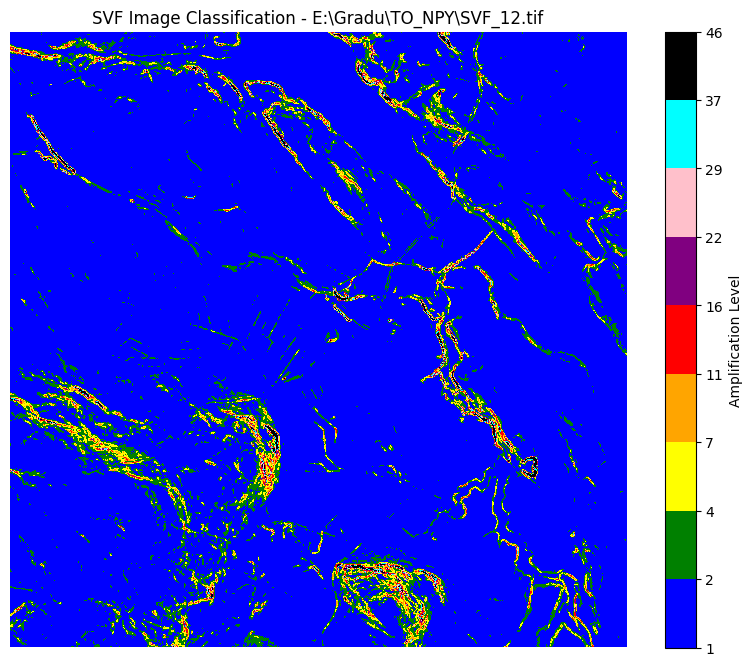

In [2]:
#-------------- Viewing a tif file ----------------

import rasterio
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Function to classify pixel values based on the given thresholds
def classify_svf(svf_data):
    # Create an empty array to store the classified results
    classified_data = np.zeros_like(svf_data)
    
    # Apply the classification rules based on the provided ranges
    classified_data[svf_data < 0.95] = 46
    classified_data[(svf_data >= 0.95) & (svf_data < 0.954)] = 37 
    classified_data[(svf_data >= 0.955) & (svf_data < 0.959)] = 29 
    classified_data[(svf_data >= 0.96) & (svf_data < 0.964)] = 22
    classified_data[(svf_data >= 0.965) & (svf_data < 0.969)] = 16
    classified_data[(svf_data >= 0.97) & (svf_data < 0.979)] = 11
    classified_data[(svf_data >= 0.975) & (svf_data < 0.979)] = 7
    classified_data[(svf_data >= 0.98) & (svf_data < 0.989)] = 4
    classified_data[(svf_data >= 0.99) & (svf_data < 0.995)] = 2
    classified_data[svf_data >= 0.998] = 1  # Highest values (close to 1) get the lowest amplification
    
    return classified_data

# Function to visualize the classified SVF image
def visualize_svf(file_path):
    # Open the .tif file using rasterio
    with rasterio.open(file_path) as src:
        svf_data = src.read(1)  # Read the first band (assuming single band image)
    
    # Classify the data according to the provided ranges
    classified_data = classify_svf(svf_data)
    
    # Set up the color map for visualizing the different ranges
    cmap = mcolors.ListedColormap(['blue', 'green', 'yellow', 'orange', 'red', 'purple', 'pink', 'cyan', 'black'])
    bounds = [1, 2, 4, 7, 11, 16, 22, 29, 37, 46]
    norm = mcolors.BoundaryNorm(bounds, cmap.N)
    
    # Create the plot
    plt.figure(figsize=(10, 8))
    plt.imshow(classified_data, cmap=cmap, norm=norm)
    plt.colorbar(ticks=[1, 2, 4, 7, 11, 16, 22, 29, 37, 46], label='Amplification Level')
    plt.title(f"SVF Image Classification - {file_path}")
    plt.axis('off')  # Turn off axis for cleaner plot
    plt.show()

# Example: Visualize the first SVF image (replace the file name with your actual file path)
visualize_svf("E:\Gradu\TO_NPY\SVF_12.tif") #Next ones are from made from numpy files, no difference


### Testing amplifying no ditches
My altered numbers in here. I wanted to save as much as possible the edge erosion of the natural streams. Some of the streams may be ditch like in size, but the edge erosion can be large. My study area is in ice-marginal features and what comes to whole Finland, the markings from ice age exsist very clearly. Our soil is many places sorted by water through the forces in younger dryas. Our lakes are past, melted glaciars and some of the fluvial streams from that time are huge. Poeple don't necessarily know they are living on top of one.

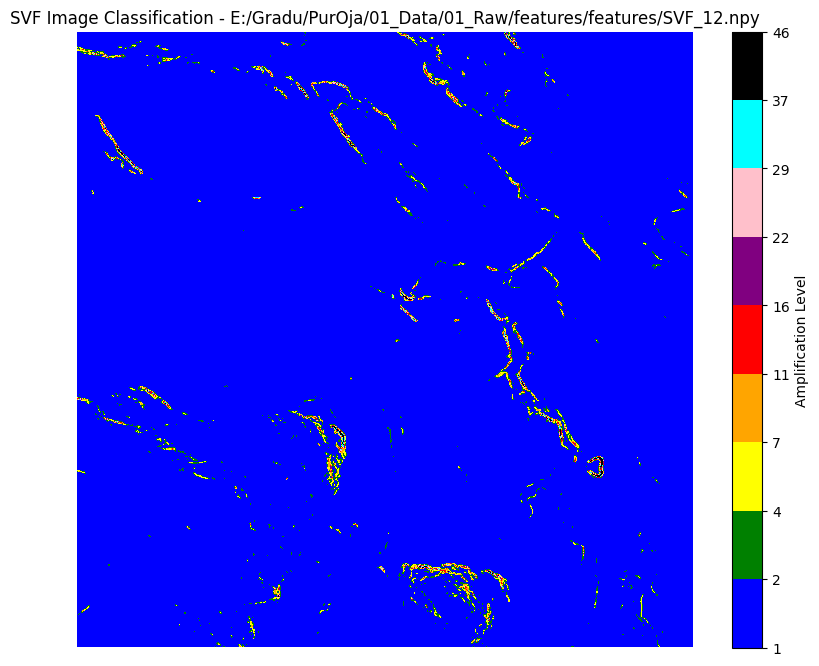

In [3]:
#-------------- Original code in use ----------------

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Function to classify pixel values based on the provided thresholds
def classify_svf(arr):
    # Create a copy of the array to store the classified results
    new_arr = np.copy(arr)
    
    #----------- Stream amplifying range -----------
    # Apply classification rules using the threshold values
    for i in range(len(arr)):
       for j in range(len(arr[i])):
            if arr[i, j] < 0.92:
                new_arr[i, j] = 46
            elif arr[i, j] < 0.93:
                new_arr[i, j] = 37
            elif arr[i, j] < 0.935:
                new_arr[i, j] = 29
            elif arr[i, j] < 0.94:
                new_arr[i, j] = 22
            elif arr[i, j] < 0.945:
                new_arr[i, j] = 16
            elif arr[i, j] < 0.95:
                new_arr[i, j] = 11
            elif arr[i, j] < 0.965:
                new_arr[i, j] = 7
            elif arr[i, j] < 0.97:
                new_arr[i, j] = 4
            elif arr[i, j] < 0.98:
                new_arr[i, j] = 2
            else:
                new_arr[i, j] = 1
    return new_arr

# Function to visualize the classified SVF image from .npy file
def visualize_svf(file_path):
    # Load the .npy file using numpy
    arr = np.load(file_path)  # Read the numpy array from the .npy file
    
    # Classify the data according to the provided thresholds
    classified_data = classify_svf(arr)
    
    # Set up the color map for visualizing the different ranges
    cmap = mcolors.ListedColormap(['blue', 'green', 'yellow', 'orange', 'red', 'purple', 'pink', 'cyan', 'black'])
    bounds = [1, 2, 4, 7, 11, 16, 22, 29, 37, 46]
    norm = mcolors.BoundaryNorm(bounds, cmap.N)
    
    # Create the plot
    plt.figure(figsize=(10, 8))
    plt.imshow(classified_data, cmap=cmap, norm=norm)
    plt.colorbar(ticks=[1, 2, 4, 7, 11, 16, 22, 29, 37, 46], label='Amplification Level')
    plt.title(f"SVF Image Classification - {file_path}")
    plt.axis('off')  # Turn off axis for cleaner plot
    plt.show()

# Example: Visualize the SVF image from the provided .npy file
visualize_svf("E:/Gradu/PurOja/01_Data/01_Raw/features/features/SVF_12.npy")


### Viewing the std


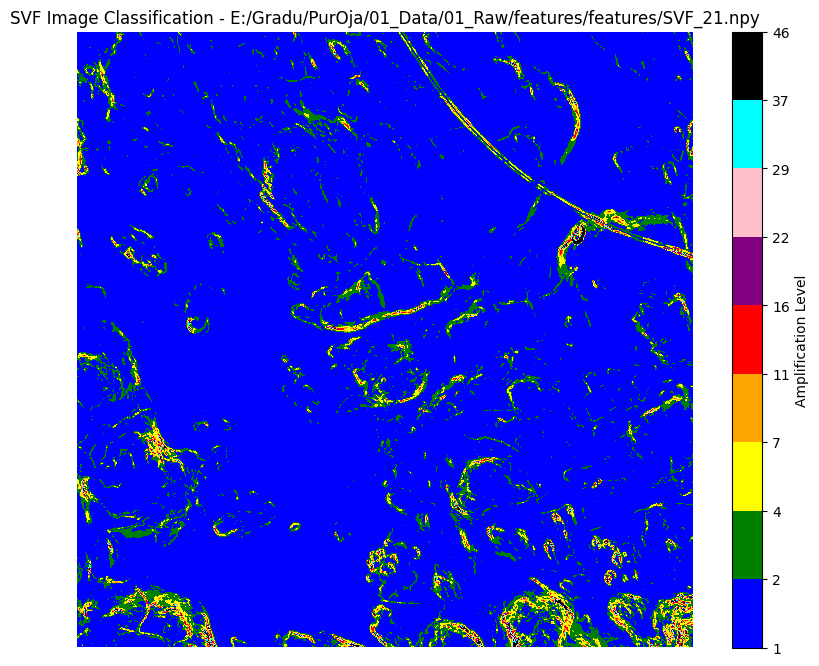

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

# Function to classify pixel values based on the provided thresholds
def classify_svf(arr):
    # Create a copy of the array to store the classified results
    new_arr = np.copy(arr)
    
    #----------- Stream amplifying range -----------
    # Apply classification rules using the threshold values
    for i in range(len(arr)):
        for j in range(len(arr[i])):
            if arr[i, j] < 0.965:
                new_arr[i, j] = 46
            elif arr[i, j] < 0.968:
                new_arr[i, j] = 37
            elif arr[i, j] < 0.97:
                new_arr[i, j] = 29
            elif arr[i, j] < 0.75:
                new_arr[i, j] = 22
            elif arr[i, j] < 0.978:
                new_arr[i, j] = 16
            elif arr[i, j] < 0.98:
                new_arr[i, j] = 11
            elif arr[i, j] < 0.985:
                new_arr[i, j] = 7
            elif arr[i, j] < 0.993:
                new_arr[i, j] = 4
            elif arr[i, j] < 0.997:
                new_arr[i, j] = 2
            else:
                new_arr[i, j] = 1
    return new_arr

# Function to visualize the classified SVF image from .npy file
def visualize_svf(file_path):
    # Load the .npy file using numpy
    arr = np.load(file_path)  # Read the numpy array from the .npy file
    
    # Classify the data according to the provided thresholds
    classified_data = classify_svf(arr)
    
    # Set up the color map for visualizing the different ranges
    cmap = mcolors.ListedColormap(['blue', 'green', 'yellow', 'orange', 'red', 'purple', 'pink', 'cyan', 'black'])
    bounds = [1, 2, 4, 7, 11, 16, 22, 29, 37, 46]
    norm = mcolors.BoundaryNorm(bounds, cmap.N)
    
    # Create the plot
    plt.figure(figsize=(10, 8))
    plt.imshow(classified_data, cmap=cmap, norm=norm)
    plt.colorbar(ticks=[1, 2, 4, 7, 11, 16, 22, 29, 37, 46], label='Amplification Level')
    plt.title(f"SVF Image Classification - {file_path}")
    plt.axis('off')  # Turn off axis for cleaner plot
    plt.show()

# Example: Visualize the SVF image from the provided .npy file
visualize_svf("E:/Gradu/PurOja/01_Data/01_Raw/features/features/SVF_21.npy")


Original image size: 5000x5000 pixels
Resized image size: 5000x5000 pixels


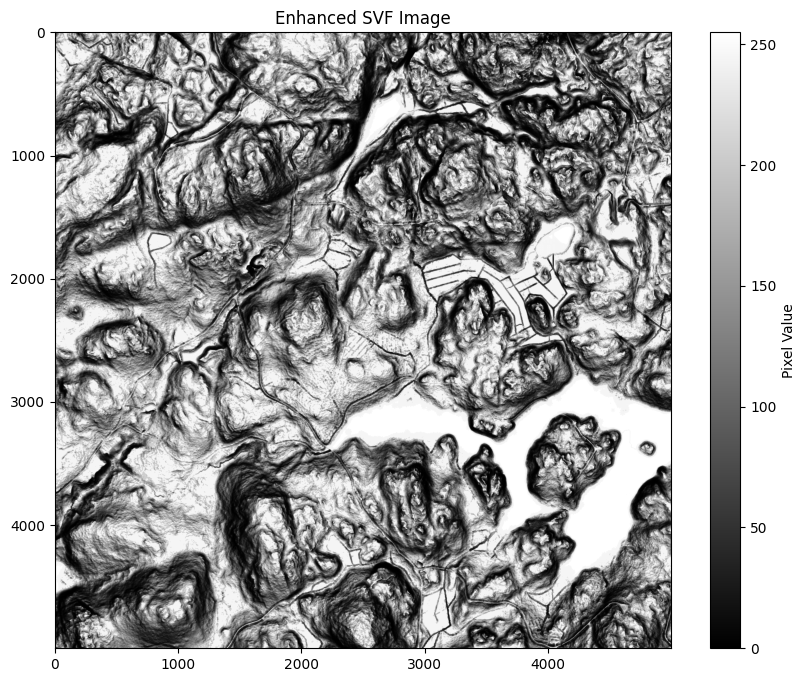

In [78]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def process_image(npy_file_path, output_npy_path):
    # Load the .npy file using numpy
    svf_image = np.load(npy_file_path)

    print(f"Original image size: {svf_image.shape[1]}x{svf_image.shape[0]} pixels")

    # Normalize the image to 0-255 and convert to 8-bit
    svf_image_normalized = cv2.normalize(svf_image, None, 0, 255, cv2.NORM_MINMAX)
    svf_image_8bit = np.uint8(svf_image_normalized)

    # Optionally downscale the image (uncomment if memory is an issue)
    downscale_factor = 1  # Change this to 0.5 for downscaling (if necessary)
    width = int(svf_image_8bit.shape[1] * downscale_factor)
    height = int(svf_image_8bit.shape[0] * downscale_factor)
    svf_image_small = cv2.resize(svf_image_8bit, (width, height), interpolation=cv2.INTER_AREA)

    # Print resized image details
    print(f"Resized image size: {svf_image_small.shape[1]}x{svf_image_small.shape[0]} pixels")

    # Apply Histogram Equalization using OpenCV
    svf_hist_eq = cv2.equalizeHist(svf_image_small)
    # Save the processed image as a .npy file
    np.save(output_npy_path, svf_hist_eq)

    # Optionally, visualize the enhanced histogram result
    plt.figure(figsize=(10, 8))
    plt.imshow(svf_hist_eq, cmap='gray', vmin=0, vmax=255)
    plt.colorbar(label='Pixel Value')
    plt.title(f"Enhanced SVF Image")
    plt.show()

def main():
    # File path for input and output .npy files
    npy_file_path = "E:/Gradu/PurOja/01_Data/01_Raw/features/features/SVF_2.npy"
    output_npy_path = "E:/Gradu/PurOja/01_Data/01_Raw/features/features/SVF_12_enhanced.npy"

    # Process the image
    process_image(npy_file_path, output_npy_path)

if __name__ == "__main__":
    main()


Pipeline for saving multiple SVF images

In [ ]:
import numpy as np
import cv2
import os
import matplotlib.pyplot as plt

def process_image(npy_file_path2, output_npy_path):
    # Load the .npy file using numpy
    svf_image = np.load(npy_file_path2)

    print(f"Original image size: {svf_image.shape[1]}x{svf_image.shape[0]} pixels")

    # Normalize the image to 0-255 and convert to 8-bit
    svf_image_normalized = cv2.normalize(svf_image, None, 0, 255, cv2.NORM_MINMAX)
    svf_image_8bit = np.uint8(svf_image_normalized)

    # Optionally downscale the image (uncomment if memory is an issue)
    downscale_factor = 1  # Change this to 0.5 for downscaling (if necessary)
    width = int(svf_image_8bit.shape[1] * downscale_factor)
    height = int(svf_image_8bit.shape[0] * downscale_factor)
    svf_image_small = cv2.resize(svf_image_8bit, (width, height), interpolation=cv2.INTER_AREA)

    # Print resized image details
    print(f"Resized image size: {svf_image_small.shape[1]}x{svf_image_small.shape[0]} pixels")

    # Apply Histogram Equalization using OpenCV
    svf_hist_eq = cv2.equalizeHist(svf_image_small)

    # Save the processed image as a .npy file
    np.save(output_npy_path, svf_hist_eq)

    print(f"Processed image saved to {output_npy_path}")

    # Optionally, visualize the enhanced histogram result
    plt.figure(figsize=(10, 8))
    plt.imshow(svf_hist_eq, cmap='gray', vmin=0, vmax=255)
    plt.colorbar(label='Pixel Value')
    plt.title(f"Enhanced SVF Image - {output_npy_path}")
    plt.show()

def main():
    # Define the base input path and output path template
    base_input_path = "E:/Gradu/PurOja/01_Data/01_Raw/features/features/SVF_{i}.npy"
    output_directory = "E:/Gradu/PurOja/01_Data/01_Raw/features/enhanced/"

    # Loop through the file numbers from 1 to 21
    for i in range(1, 22):
        # Build the input and output file paths
        npy_file_path = base_input_path.format(i=i)
        output_npy_path = os.path.join(output_directory, f"SVF_{i}_enhanced.npy")
        
        # Ensure the output directory exists
        os.makedirs(output_directory, exist_ok=True)
        
        # Process the image and save the enhanced result
        process_image(npy_file_path, output_npy_path)

if __name__ == "__main__":
    main()


### SVF histogram equaliser
Fluvial "foot prints" example.

Original image size: 18000x24000 pixels
Resized image size: 7200x9600 pixels


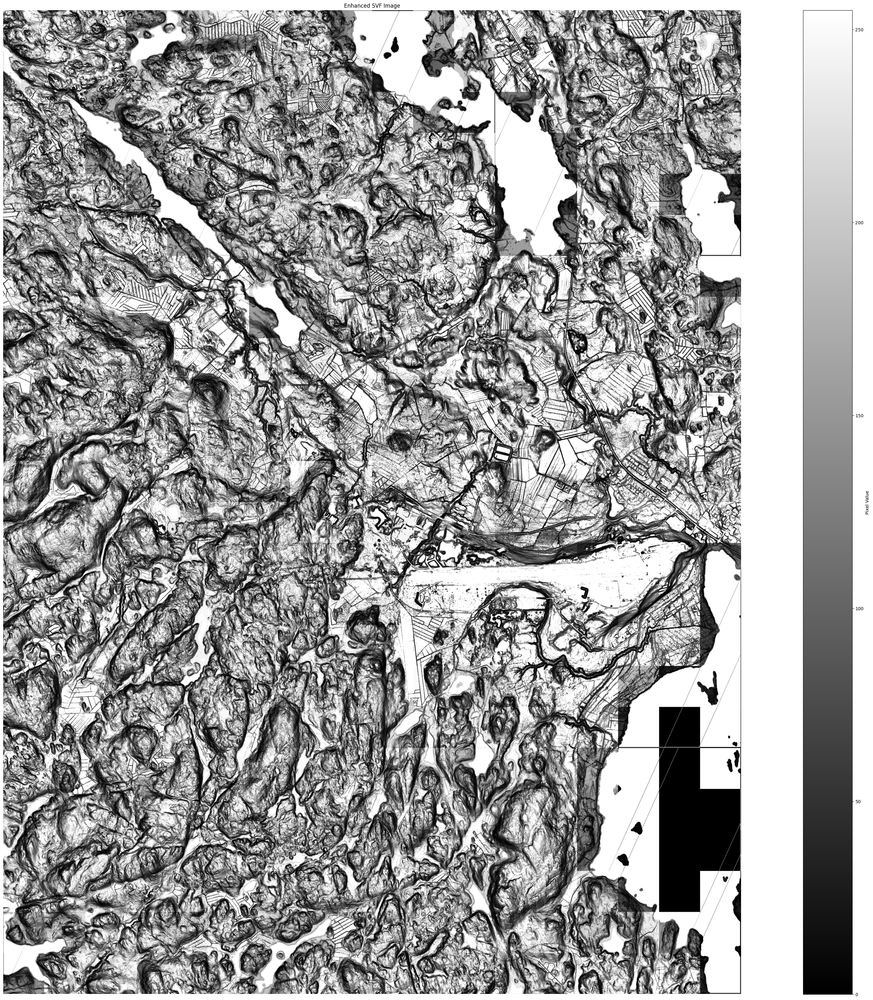

In [17]:
import numpy as np
import rasterio
import cv2
import os
import matplotlib.pyplot as plt

def process_image(img_path):
    """
    Processes an image from a file path, optionally resizes it, and plots it.
    """
    # Load the raster file using rasterio
    with rasterio.open(img_path) as src:
        svf = src.read(1)  # Read the first band

    # Print the original image size
    print(f"Original image size: {svf.shape[1]}x{svf.shape[0]} pixels")

    # Optionally downscale the image
    downscale_factor = 0.4  # Change this to <1 (e.g., 0.5) to downscale
    width = int(svf.shape[1] * downscale_factor)
    height = int(svf.shape[0] * downscale_factor)
    svf_resized = cv2.resize(svf, (width, height), interpolation=cv2.INTER_AREA)

    # Print resized image details (if resized)
    print(f"Resized image size: {svf_resized.shape[1]}x{svf_resized.shape[0]} pixels")

    # Visualize the original or resized image
    plt.figure(figsize=(50, 40))
    plt.imshow(svf_resized, cmap='gray', vmin=0, vmax=255)
    plt.colorbar(label='Pixel Value')
    plt.title("Enhanced SVF Image")
    plt.axis('off')
    plt.show()

# Specify the image path
svf_path = "E:/Gradu/PurOja/01_Data/03_Figures/fluvial_features_example.tif"

# Call the process_image function
process_image(svf_path)
